## Text analysis

In [1]:
import pickle as pkl
import matplotlib.pyplot as plt
import random
from random import sample 
import pandas as pd
import seaborn as sns
import numpy as np
import re
from wordcloud import WordCloud
import os
import json
from tqdm import tqdm

In [2]:
tmp = []
flair_list = []
for flair in os.listdir('Flairs'):
    tmp.append(preprocess(open('Flairs/' + flair).read()))
    flair_list.append(flair[:-4])

NameError: name 'preprocess' is not defined

In [3]:
flair_list = ["enfj","enfp","entj","entp","esfj","esfp","estj","estp","infj","infp","intj","intp","isfj","isfp","istj","istp"]

In [4]:
tmp = [[] for _ in range(len(flair_list))]


with open('links2022_clean.ndjson') as f:
    for line in f:
        data = json.loads(line)
        for i in range(len(flair_list)):
            if data['flair'] == flair_list[i]:
                tmp[i] += data['comment']

In [5]:
#Maybe see https://pypi.org/project/lexical-diversity/

def lexical_diversity(text):
    sampled = text[0:2000]
    return len(set(sampled)) / len(sampled)

Lexical Diversity of enfj: 0.5125
Lexical Diversity of enfp: 0.489
Lexical Diversity of entj: 0.4405
Lexical Diversity of entp: 0.485
Lexical Diversity of esfj: 0.435
Lexical Diversity of esfp: 0.5185
Lexical Diversity of estj: 0.5015
Lexical Diversity of estp: 0.453
Lexical Diversity of infj: 0.4625
Lexical Diversity of infp: 0.4925
Lexical Diversity of intj: 0.479
Lexical Diversity of intp: 0.5085
Lexical Diversity of isfj: 0.4955
Lexical Diversity of isfp: 0.4365
Lexical Diversity of istj: 0.471
Lexical Diversity of istp: 0.548


<BarContainer object of 16 artists>

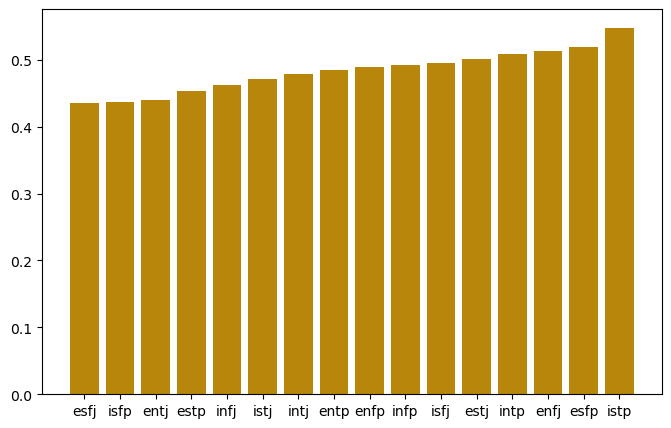

In [6]:
# lexical diversity of each flair
lexical_diversity_list = [0]*len(tmp)
for i in range(len(tmp)):
    lexical_diversity_list[i] = lexical_diversity(tmp[i])
    print('Lexical Diversity of',flair_list[i] + ':',lexical_diversity_list[i])

# sort lexical diversity and flair list
lexical_diversity_list, tmp_flair_list = zip(*sorted(zip(lexical_diversity_list, flair_list)))

# bar plot over lexical diversity of each flair sorted from highest to lowest
plt.figure(figsize=(8,5))
plt.bar(tmp_flair_list, lexical_diversity_list, color='darkgoldenrod')

# Sentiment analysis

In [7]:
sentiment_frame=pd.read_csv("sentiment.txt",index_col=0,sep="\t")
sentiment_dict=sentiment_frame.to_dict()["happiness_average"]

def calculate_sentiment(text, sentiment_dict):
    sentiment = []
    for word in text:
        if word in sentiment_dict:
            sentiment.append(sentiment_dict[word])
    return sentiment

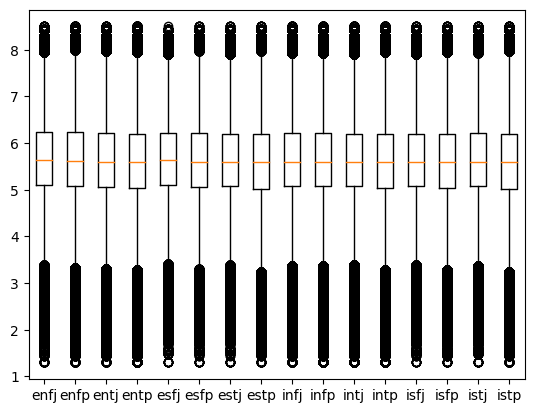

In [8]:
# Sentiment of each flair
sentiment_list = [0]*len(tmp)
for i in range(len(tmp)):
    sentiment_list[i] = calculate_sentiment(tmp[i],sentiment_dict)
    #print('Sentiment of',flair_list[i] + ':',sentiment_list[i])

plt.boxplot(sentiment_list, labels=flair_list)
plt.show()

Sentiment of enfj: 4.612979900734024
Sentiment of enfp: 4.599874882124388
Sentiment of entj: 4.5320494231366855
Sentiment of entp: 4.507495079409213
Sentiment of esfj: 4.728681326566163
Sentiment of esfp: 4.594644307446276
Sentiment of estj: 4.626665082996514
Sentiment of estp: 4.509562036557314
Sentiment of infj: 4.5618832396899
Sentiment of infp: 4.5740718164267395
Sentiment of intj: 4.523694036818832
Sentiment of intp: 4.514019356727025
Sentiment of isfj: 4.599357293758291
Sentiment of isfp: 4.582546451830939
Sentiment of istj: 4.562613274692833
Sentiment of istp: 4.533992078147147


<BarContainer object of 16 artists>

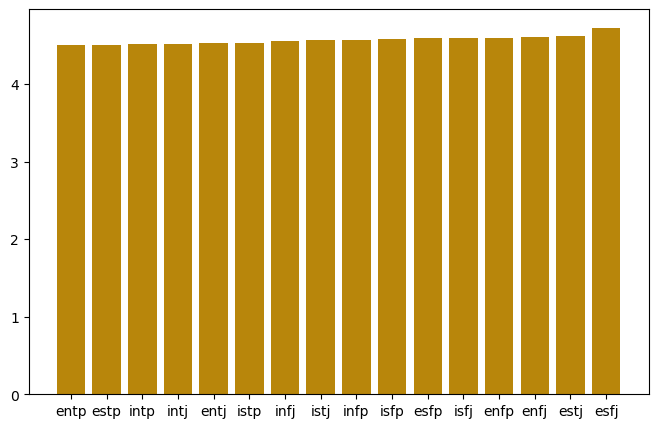

In [9]:
def calculate_sentiment(text, sentiment_dict):
    sentiment = 0
    for word in text:
        if word in sentiment_dict:
            sentiment +=sentiment_dict[word]
    return sentiment/len(text)

# Sentiment of each flair
sentiment_list = [0]*len(tmp)
for i in range(len(tmp)):
    sentiment_list[i] = calculate_sentiment(tmp[i],sentiment_dict)
    print('Sentiment of',flair_list[i] + ':',sentiment_list[i])

# sort lexical diversity and flair list
sentiment_list, tmp_flair_list = zip(*sorted(zip(sentiment_list, flair_list)))

# bar plot over lexical diversity of each flair sorted from highest to lowest
plt.figure(figsize=(8,5))
plt.bar(tmp_flair_list, sentiment_list, color='darkgoldenrod')

Sentiment of enfj: 5.639229785360622
Sentiment of enfp: 5.619197954963162
Sentiment of entj: 5.578622550129279
Sentiment of entp: 5.568366063549884
Sentiment of esfj: 5.627605971751712
Sentiment of esfp: 5.610884903914638
Sentiment of estj: 5.589195819212569
Sentiment of estp: 5.572745581501357
Sentiment of infj: 5.601422160010828
Sentiment of infp: 5.59711020100009
Sentiment of intj: 5.57357626386838
Sentiment of intp: 5.563880049243991
Sentiment of isfj: 5.602315669022904
Sentiment of isfp: 5.582188821157074
Sentiment of istj: 5.582716993906568
Sentiment of istp: 5.568234869387246


<BarContainer object of 16 artists>

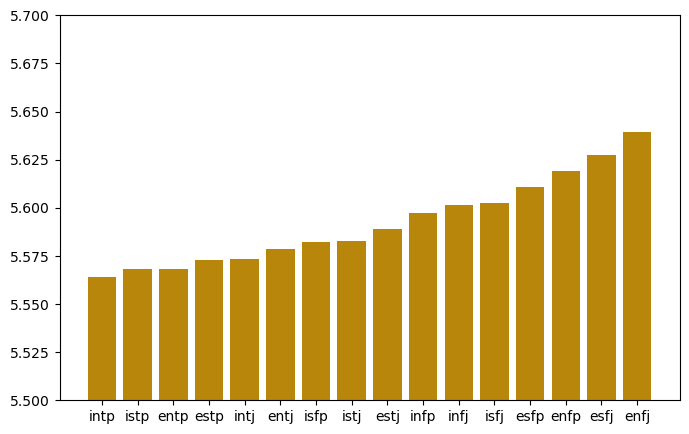

In [10]:
def calculate_sentiment(text, sentiment_dict):
    sentiment = []
    for word in text:
        if word in sentiment_dict:
            sentiment.append(sentiment_dict[word])
    return np.mean(sentiment)

# Sentiment of each flair
sentiment_list = [0]*len(tmp)
for i in range(len(tmp)):
    sentiment_list[i] = calculate_sentiment(tmp[i],sentiment_dict)
    print('Sentiment of',flair_list[i] + ':',sentiment_list[i])

# sort lexical diversity and flair list
sentiment_list, tmp_flair_list = zip(*sorted(zip(sentiment_list, flair_list)))

# bar plot over lexical diversity of each flair sorted from highest to lowest
plt.figure(figsize=(8,5))

#Rescale y axis
plt.ylim(5.5, 5.7)

plt.bar(tmp_flair_list, sentiment_list, color='darkgoldenrod')

## Word cloud

In [11]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [12]:
vectorizer = TfidfVectorizer()
tf_idf= vectorizer .fit_transform([' '.join(list) for list in tmp])
word_list = vectorizer.get_feature_names_out()



In [13]:
tf_idf[15,:]

<1x329304 sparse matrix of type '<class 'numpy.float64'>'
	with 47859 stored elements in Compressed Sparse Row format>

In [ ]:
word_list

array(['00', '000', '00000000000000012', ..., 'ﾉﾉﾟi', 'ﾟヮﾟ', 'ﾟヮﾟuhm'],
      dtype=object)

In [14]:
def tf_idf_to_string(tf_idf_matrix, word_list):
    feature_index = tf_idf_matrix.nonzero()[1]
    tfidf_scores = [(word_list[i], tf_idf_matrix[0, i]) for i in feature_index]
    tf_idf_string = ''
    for word, score in tfidf_scores:
        tf_idf_string += (word + ' ') * int(score * 100)  # Multiplying by 10 for better visualization
    return tf_idf_string

data_for_wordcloud = []
for i in range(16):
    data_for_wordcloud.append(tf_idf_to_string(tf_idf[i, :], word_list))

In [ ]:
data_for_wordcloud

['commenthttpswwwredditcomrmbticomments5tum23how_can_if_figure_out_my_function_stackingddp76d7 commenthttpswwwredditcomrmbticomments5tum23how_can_if_figure_out_my_function_stackingddp76d7 commenthttpswwwredditcomrmbticomments5tum23how_can_if_figure_out_my_function_stackingddp76d7 tc posthttpwwwtypologycentralcomforumswhatsmytype85135pleasehelptypepost2700454htmlpost2700454 puzzler 10post foursome forumites neopir ssr ssr ssr haz correlational correlational zomg mbtirelated forumfamous reynierse reynierse dichotomycentric dichotomycentric keirsey psychometrically psychometrically bogosity respectability roundup roundup district district endorsed grant grant harold harold functioncentric costa costa mccrae mccrae murry perc perc perc journal ppl ppl substantially introversion reliability socalled explained psychologist typical official official official decade substantial contrast extraversion ei par dom respectable respectable respectable mention inconsistent inconsistent noted associat

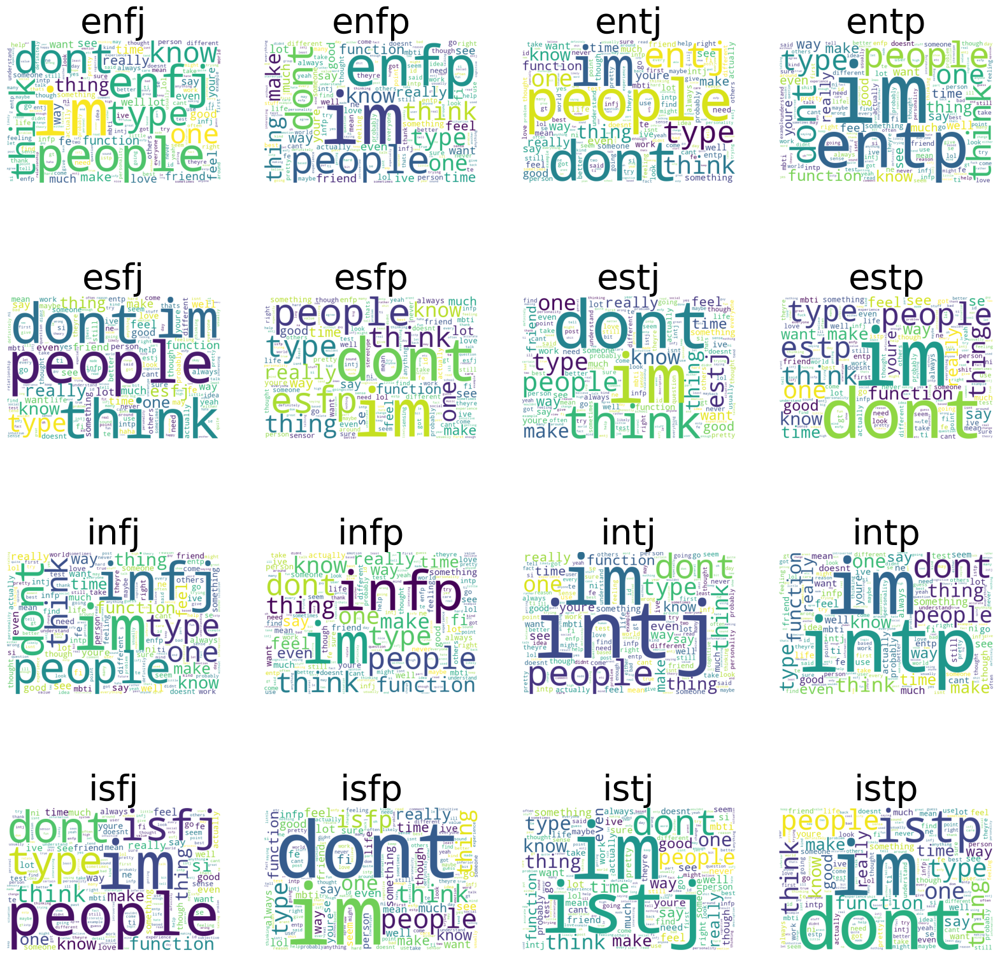

In [ ]:
fig, ax = plt.subplots(4, 4, figsize=[20, 20])
for i in range(4):
    for j in range(4):

        wordcloud = WordCloud(background_color='white', width=600, height=400,collocations=False).generate(data_for_wordcloud[4*i+j])
        ax[i,j].imshow(wordcloud)
        ax[i,j].axis('off')
        ax[i,j].set_title(flair_list[4*i+j],fontsize=40)
plt.show()

In [15]:

flair_list = ["intp","intj","entp","entj","infj","infp","enfj","enfp","istj","isfj","estj","esfj","istp","isfp","estp","esfp"]

mention_dict = {}
for flair in flair_list:
    temp_dict = {}
    for temp_flair in flair_list:
        temp_dict[temp_flair] = 0
    mention_dict[flair] = temp_dict 

with open('links2022_clean' + '.ndjson',"r", encoding='utf-8') as f:
    for line in tqdm(f):
        post=json.loads(line)
        flair = post["flair"]
        comment = post["comment"]
        for word in comment:
            if word in flair_list:
                mention_dict[flair][word] += 1

0it [00:00, ?it/s]

1245214it [00:20, 61202.80it/s]


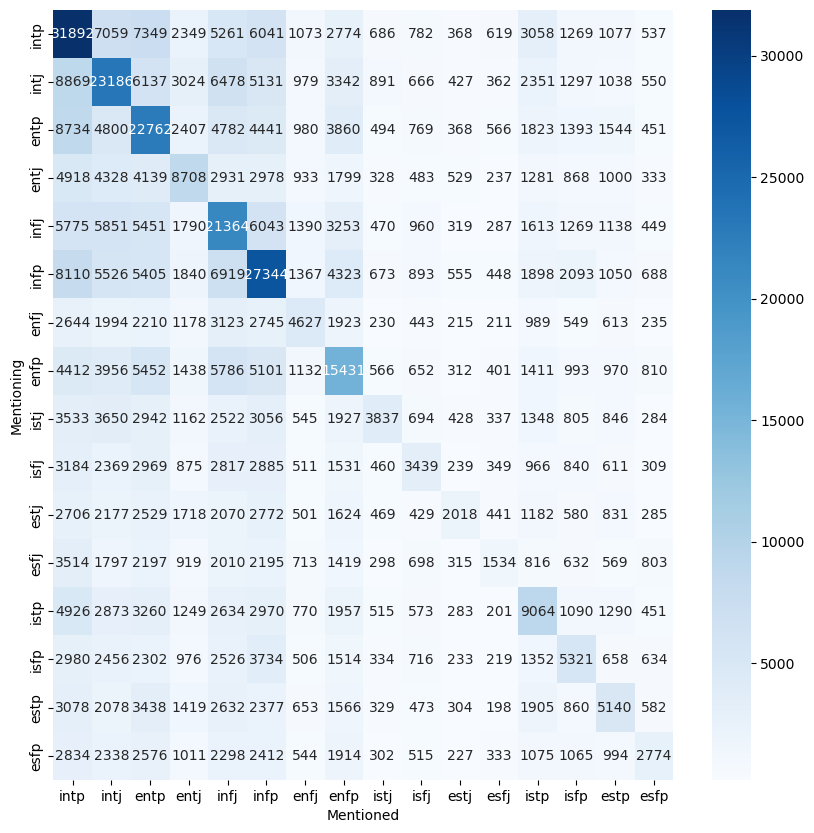

In [16]:
# plot mention matrix
import seaborn as sns
import matplotlib.pyplot as plt

mention_matrix = pd.DataFrame.from_dict(mention_dict)
plt.figure(figsize=(10,10))
sns.heatmap(mention_matrix, annot=True, fmt='g', cmap='Blues')
plt.xlabel('Mentioned')
plt.ylabel('Mentioning')

plt.show()


# Mentioned Sentiment

In [17]:
flair_list = ["intp","intj","entp","entj","infj","infp","enfj","enfp","istj","isfj","estj","esfj","istp","isfp","estp","esfp"]

mention_dict = {}
for flair in flair_list:
    temp_dict = {}
    for temp_flair in flair_list:
        temp_dict[temp_flair] = []
    mention_dict[flair] = temp_dict 

with open('links2022_clean' + '.ndjson',"r", encoding='utf-8') as f:
    for line in tqdm(f):
        post=json.loads(line)
        flair = post["flair"]
        comment = post["comment"]
        for word in comment:
            if word in flair_list:
                mention_dict[flair][word] += post["comment"]

1245214it [00:22, 55450.21it/s]


In [18]:
for flair in flair_list:
    temp_dict = {}
    for temp_flair in flair_list:
        temp_dict[temp_flair] = calculate_sentiment(mention_dict[flair][temp_flair],sentiment_dict)
    mention_dict[flair] = temp_dict 

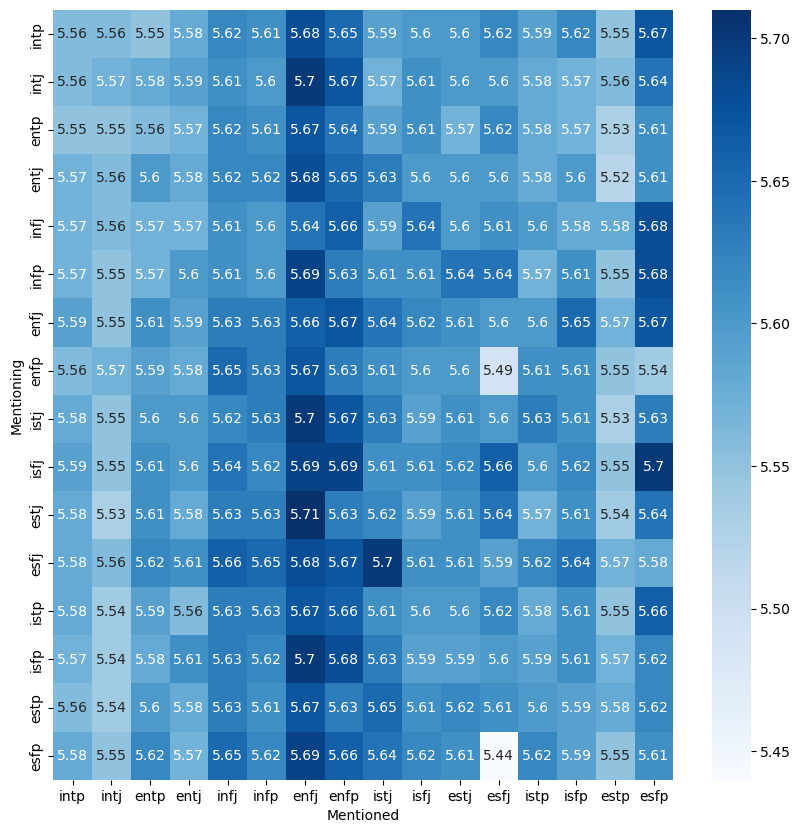

In [19]:
# plot mention matrix
import seaborn as sns
import matplotlib.pyplot as plt

mention_matrix = pd.DataFrame.from_dict(mention_dict)

mention_matrix = mention_matrix.round(2)

plt.figure(figsize=(10,10))
sns.heatmap(mention_matrix, annot=True, fmt='g', cmap='Blues')
plt.xlabel('Mentioned')
plt.ylabel('Mentioning')

plt.show()

# Word cloud what is said

In [20]:
flair_list = ["intp","intj","entp","entj","infj","infp","enfj","enfp","istj","isfj","estj","esfj","istp","isfp","estp","esfp"]

mention_dict = {}
for flair in flair_list:
    temp_dict = {}
    for temp_flair in flair_list:
        temp_dict[temp_flair] = []
    mention_dict[flair] = temp_dict 

with open('links2022_clean' + '.ndjson',"r", encoding='utf-8') as f:
    for line in tqdm(f):
        post=json.loads(line)
        flair = post["flair"]
        comment = post["comment"]
        for word in comment:
            if word in flair_list:
                mention_dict[flair][word] += post["comment"]

1245214it [00:22, 55768.60it/s]


In [41]:
#Select talking flair
flair = "intp"

word_dict = mention_dict[flair]

In [42]:
vectorizer = TfidfVectorizer()
names = list(word_dict.keys())
tf_idf= vectorizer .fit_transform([' '.join(list) for list in word_dict.values()])
word_list = vectorizer.get_feature_names_out()

In [43]:
data_for_wordcloud = []
for i in range(16):
    data_for_wordcloud.append(tf_idf_to_string(tf_idf[i, :], word_list))

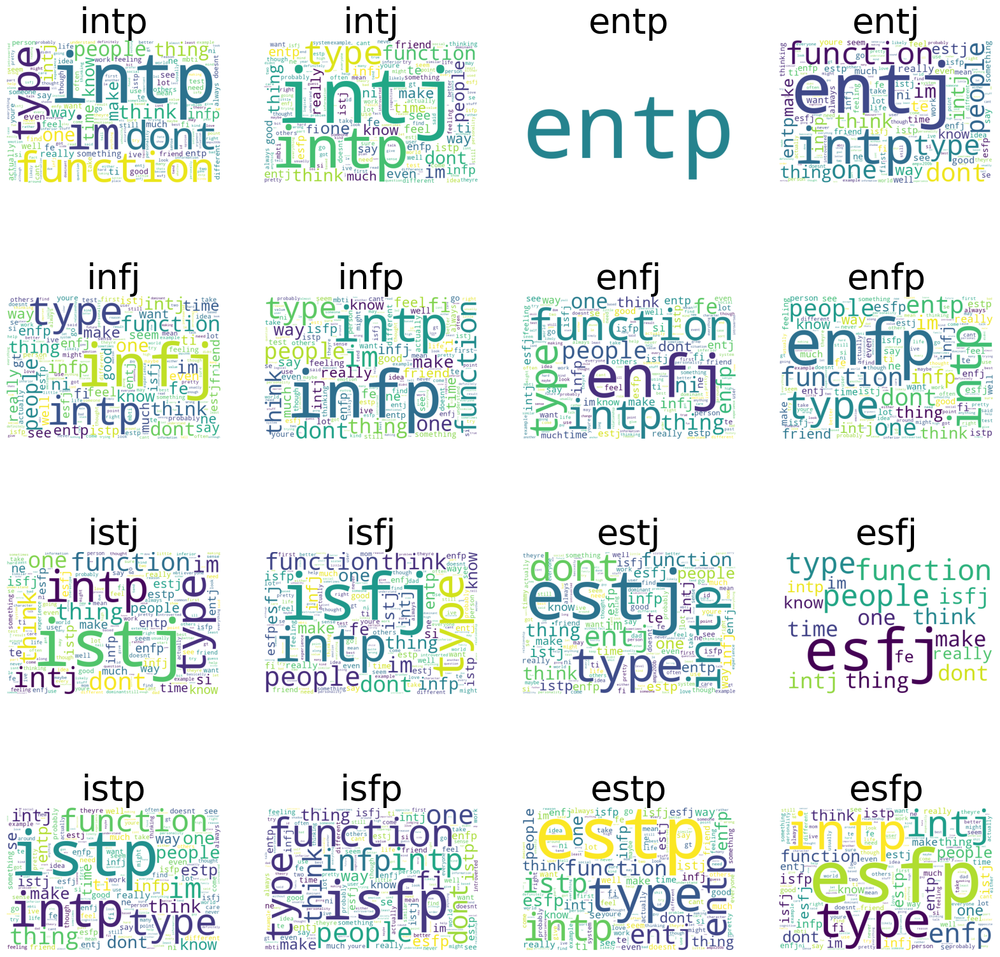

In [44]:
fig, ax = plt.subplots(4, 4, figsize=[20, 20])
for i in range(4):
    for j in range(4):

        wordcloud = WordCloud(background_color='white', width=600, height=400,collocations=False).generate(data_for_wordcloud[4*i+j])
        ax[i,j].imshow(wordcloud)
        ax[i,j].axis('off')
        ax[i,j].set_title(names[4*i+j],fontsize=40)
plt.show()

In [32]:
#What is said 
mentioning = "enfj"
mentioned = "estj"

with open('links2022_clean' + '.ndjson',"r", encoding='utf-8') as f:
    for line in tqdm(f):
        post=json.loads(line)
        
        if flair == mentioning:
            comment = post["comment"]
            for word in comment:
                if word == mentioned:
                    print(" ".join(post["comment"]))
                    print("")

0it [00:00, ?it/s]

6292it [00:00, 59027.53it/s]

hahaha entp would clash given get along best fi type think estj thing make real sense p

estj attracted istps theyre always super competent b treat emotion morerationally low stack feeling homies life c aux se mean theyll probably like going cool adventure

estj something delta quadra ftw infps especially smart kind istjs like tsundere type enfps search raptor attic estjs solidarity

well hard advice worth entp married intj work communication develop inferior fi dont blame difficulty communicating emotion type work improve always estj gain comfort fi tertiary fe led many onedirectional relationship learned underexpose emotion focusing solving person problem grew past learned value emotion stop telling others feeling important mine result unbelievable marriage ive gained consistent happiness never dreamed possible hard worth challenge grow easy everyone would happy fact people truly achieve need make constant priority dont listen friend think know best society tell acceptable fault erro

26205it [00:00, 86274.32it/s]

estj self 386 musical 357 language 329

current type istj introverted type intj extroverted type estj

estj stuff id get done isfp steve rogers one love mellow artist folk idealistic

sound like estj

said estj detected happening would kept id totally bias answer towards getting estj got ta show think want see

said estj detected happening would kept id totally bias answer towards getting estj got ta show think want see

depends job youre going forsoftware engineer intj maybe ientp guess marketing enfp enfj could good something freaking stupid officerelated sure stj management estj monkey istj

met estj entp estp

know elaborate intuitive side mainly lot type show mannerism thing talk good connecting idea without explained say logical thing reason also thought estj thing talked convinced u otherwise still young hard say personality could end locking

least favorite favorite 1 estj 2 entj 3 istj 4 estp 5 esfj 6 esfp 7 isfp 8 istp 9 isfj 10 entp 11 intj 12 enfj 13 intp 14 infj 15 infp 16

45484it [00:00, 89729.61it/s]

entj mother want like contrary saying absorb saying excellent ti argument wash like water duck back say dont agree arrive conclusion somehow nullified argument incredibly frustrating ni user usually dont take someone else simple word ive made mistake unless figure detail want hear detail frustration certain estj understand went wrong avoid future sure indeed need admonishment someone else however know make mistake infrequently quite open possibility made mistake often notice mistake people notify sound like ntj immature quite possibly could ntj elitism thing going case resent challenging selfimage discount competence matter perhaps broadly like know many experience superior superior continue superior love fact superior person think ive made mistake nonsense must lock competence doesnt know superior dont make mistake

gt id love te doms share insight experience help u see world clarity describe extj world outline focal point define experience interesting see estj entj world differ well 

64054it [00:00, 81143.61it/s]

meh really main extravert function ne infp oh honey im sorry feel way let talk lesson situation intp tried x solve thing entp let take care case tertiary fe developed consider awesome possibility situation youre case fe developed dont know typical enfps main extravert function fe infj totally understand would feel way sound like right thing isfj perfectly okay cry cry esfj awh suck cuddle chocolate dont know typical enfjs main extravert function se istp keep talking im listening yes know im replying listening really esfp absolutely right feel way let something fun cheer estp actually prettu accurate isfp oh dont know seen different version main extravert function te entj need sad look situation angle x intj kind brought onto know got nothing istj estj never seen try comfort anyone

think unhealthy manifestation best traced domaux pair unhealthy neti tine entp intp devil advocate everything oblivion never commit opinion nefi fine enfp infp get trapped need consider everything need make 

85463it [00:00, 91838.74it/s]

estj good

really see istjs everywhere estj slightly le

agree example seems like infj common female type know followed xsfp know xstp female xsfj female joke know way stp guy stj guy like swear clear plurality outright majority guy know stp know one estj guy though ive met maybe used know one istj guy

meet estp male everywhere sfj everywhere istj lot much estj pretty rare tbh never met nfj life im sure istp either intjs much statictics show entps quite lot tbh enfps lot intps pretty rare especially female enfps lot infps quite lot ive seen lot isfp male isfp female esfps extremely rare compared statistic show know one esfp male female know entj

estj 3w4 spso 387

lol asked estj hubby question said thing boring efficient probably

think youre estj edit ever posted type maybe different account

think adele dollhouse might estj possibly istj basis dont quite get intj vibe though

gt yeah well enneagram type specific cognitive function mutually irreducible conjunction te type 2 trying l

107576it [00:01, 99202.10it/s]

gti come thing mind come 1000 possibility something future play usually take thought make plan future pretty good brainstorming like keep open mind want weed leaning estj far

chandler entp monica estj wouldnt use example watched riverdale top head jughead jones infp betty cooper exfj seem kind couple

wild estj appeared

interesting think monica esfj estj

dad estj mom esfj sister xsxj infp parent influenced u mom encouraged creativity dad encouraged productivity feel like dad definitely shaped te share function reverse order thus highlight weakness pet peeve caused conflict ive always felt suppressed controlled judged demand system like employee daughter know firework emotion affected mom could either esfj enfp either way injected u electric syrupysweet ne always encouraging u invest possibility join scheme adventure controlling rigid moment tend challenge see past system expectation rule habit though feel unseen misunderstood sometimes always super close bond understanding point cou

131659it [00:01, 108494.38it/s]

nah way stubborn enough estj would certainly clash lot one

intp accordion entp analog synths infj hammond organ intj piano estp whatever type guitar dave mustaine play idk istj violin entj drum kit istp bass esfp acoustic guitar isfp kalimba xylophone estj bugle isfj banjo esfj lower range saxophone enfp ukulele infp jim morrison poetry shit enfj social justice

type band intp cream gogol bordello entp might giant intj ultimate spinach entj entjs know hip hop head ill give vince staple enfp fleetwood mac jank sketchy sketch happened esfp panic disco infp old gray estp uriah heep david byron seethed sefe estj boston estjs eat arena rock shit istp door isfp beatles postrevolver esfj beatles prerevolver isfj marina diamond infj soft machine enfj beach boy pet sound ig

gt speaking think avon type people say estp think esfj agree although could also make argument esfp lot avon attachment thing like corner seems lot fidriven anything else clearly pretty highse also get along really well br

153238it [00:01, 98401.43it/s] 

closest friend entj estj entp infp enfp trustworthy friend estj entp entj annoying friend sometimes infp boring friend x work best enfp work worst dont know favorite hang entj girl infp enfp

closest friend entj estj entp infp enfp trustworthy friend estj entp entj annoying friend sometimes infp boring friend x work best enfp work worst dont know favorite hang entj girl infp enfp

anecdotal take grain salt estj wife get along least infj friend otoh since im entp shadow tert inf fi amp se get along well infp brother esfp friend

estj enfp dynamic like

robert e lee strike tidom ixtp douglas macarthur istj julius ceasar politician really entj leonidas hard say legend leading duty guess estj saladin like ceasar masterplan le people intj

estj thank getting shit done sometimes feel like werent id forget buy food thank saying mean never wonder doublespeak hidden meaning thank able enjoy little thing much big one thank never letting forget

agreed id like mix intj estj one please

estj appre

175679it [00:01, 102860.66it/s]

wasnt really thinking tj wrong thought two estj statistic often give entj least common type among woman

bisxual female intj married lesbian intp commited relationship bisexual male enfp well best friend lesbian infj lesbian intj bisexual enfp woman intj enfp married lgbtq people ive known well enough type definitivelyknow confirm typing roughly chronological order gay male enfj highschool bff married gay male estj lgbt member former college social circle talk occasionally longer close partly drifting apart also moving thousand mile away consisting lesbian infp married bisexual esfj woman bisexual somewhat genderweird afab enfp bisexual female estj bisexual female isfj bisexual female istp heterosexual trans female intp former coworker bi prior transition different heterosexual trans female intp acquaintance ditto lesbian trans female intp acquaintance lesbianleaning bisexual isfp datedwas fwbs bisexual male intp friend wife bisexual inxx guess probably infj lesbian istp dated best fri

199471it [00:02, 107696.90it/s]

love language definitely act service ill start adding thing people need do romantic platonic love example edit lot friend resume job hunt theyre stressed estj

im avoiding superherosfantasy character cuz theyre real people lol infp tom 500 day summer charlie brown enfp clementine eternal sunshine michael scott intp sheldon big bang theory entp bojack horseman jim halpert isfp rose titanic django esfp homer simpson daisy great gatsby istp john luther hopper stranger thing estp saul goodman sonny corleone infj atticus finch jay gatsby enfj elle wood legally blonde intj walter white michael corleone entj jack donaghy 30 rock isfj watson sherlock holmes esfj monica friend andy office istj mike breaking bad ron swanson estj roy cohn angel america angelica rugrats

didnt lol ive napping ill get second season first season seemed haphazard rule job sake exploration fit estj imo hella impulsive wonder enfp possibility tho

istj ned stark isfj catelyn stark infj remus lupin intj lelouch vi britt

233574it [00:02, 138225.00it/s]

1 mine im awesome individual 2 dont know actual type girl ive dated interested typically like smart sassy 3 best friend intp 4 yes mistyped entp intj isfj estj entj think depends mood taking test looking cognitive function enfp fit closely though perfectly 5 everybody strength weakness like asking superman would want batman cant really compare 6 professor college thought intj based exam essay 7 like impulsively get shit time im flexible enough find way work 8 easily distracted walking hall work someone stop ask question work absolutely love im happy talk get involved conversation forget going hall first place 9 ive told cold analytical many different occasion people cry around make uncomfortable want comfort really dont know also bother people try comfort im upset id rather left alone work

5 mean esfj estj fe user yes know everyone us everything

would say intj entj estj im kinda biased lol

negan taste another entp enjoy izaya orihara rick grime istj john marston istp trevor philip e

264099it [00:02, 144922.27it/s]

lmao estj gun extremely underrated

cant say type hate say type people dislike tend cause know 910 people random room smoke doesnt mean 910 world population smoke requires time thought type someone idk type everyone disagree suspect bos either entj estj im leaning towards estj boy even though he nice trait annoy scare crap rather fake sometimes seeming pretty intolerant mistake failing consider fact everyone human empathising others general good trait like flipping people controlling emotion he also quite generous appreciate cant get around rigidness also si user know pretty opposite world view occasionally clash there still love isfjs even though amazing probably fact im laidback rigidrule abiding nature kinda irks tend bit stubborn way see thing one know course saying si user like come enneagram im 7w6 sosp ive noticed dont well 1 6 okay general theyre unhealthy oh boy constant worrying make want slap em way moon

cant say type hate say type people dislike tend cause know 910 people 

298086it [00:02, 157099.85it/s]

mom estj dad isfj sister esfp intp grandma poor esfj

mother estj father istp sister esfj entp grandma intp im never sure theyre really alive dead

estj mom isfp dad esfp sister entp op

l u c k family mom estj dad infp si enfp unhealthy fi developed te infj

uncle test honestly thought gon na estp instead estj

infp dad estj mom mom always support try help much stuck rule authority even ridiculous always expects really especially grade cant get le b sometimes compare despite really selfless caring supportive lot trauma dad really cool funny besides le ruleoriented passiveaggressive stress lot really supportive

mom estj dad istp sure sister cause ive met several annoying sensor different type youre probably entp

well still put nonarbitrary though maybe subliminal order within tier dont think coincidence youre intp intp start list estj second row give credence ordering like infjs least huh p

esfjs woman mean estj

game generally best one series answer follows red light green light es

330509it [00:02, 143903.35it/s]

think family get along pretty well sometimes think would nice mom istj instead estj

mom estj dad istj maybe

waited long time moment little green friend cackle infp luke skywalker enfp ahsoka tano istj captain rex estj commander cody intp moff jerjerrod entp hondo ohnaka isfj c3po esfj hera syndulla isfp tup esfp anakin skywalker intj five although could entj ill get back finish star war clone war rewatch hated entj pong krell scumbag istp kanan jarrus estp hardcase infj obiwan kenobi enfj bail organon

mbti affect behavior pattern behavior within type intp never 2 inferior fe let look type 2 description theyre warm empathetic selfsacrificing people push others life help issue due fear unloved extraverted engaging trouble dealing even acknowledging need type lead introverted judging self come anything else struggle youre telling intp fit trait entire system becomes meanignless point even type anymore estj 7 unfocused scatterbrained imaginative idealistic optimistic futureoriented pron

366370it [00:03, 158283.22it/s]

estj ill let te self take

youre describing common experience lead thinking type 4 u istp intp estj entj inferior feeling inferior isnt fully conscious function difficult recognize emotion let alone process especially true young people often delay feeling hit fact ive noticed thinker tertiary feeling little emotional depth capacity lead thinker instance istj mentioned comment certain music genre causing bad mood music doesnt affect emotionally edit httpsimgurcomax3l7jw5

ohh cmon put faith te fellow believe make work working controlled estj gon na tough one ngl

definitely going plan around xstps come physical combat enfj also somewhat usable se infj potential issue fe actually cloud judgement dont allow read u easily also sniped esfps still se doms even tho higher emotional intelligence make le valuable estps combat scenario would still fight fervor conviction xstp isfps one im entirely sure optimize scenario still auxiliary se tertiary ni tho least much usable say infp could make gre

398734it [00:03, 156633.50it/s]

well phosphophyllite land lustrous four different pdb entry esfp istp intj estj long story

mbti type estj favorite character tenya iida hero academia estj kunikida doppo bungou stray dog istj giyuu tomioka demon slayer istj hal jordan dc green lantern esfp bruce wayne dc batman intj cyrus albright octopath traveller intp xingqiu genshin impact infj ive also noticed disproportionately large number favorite excluding written chose favorite favorite happen istjs riza hawkeye fma teresa lisbon mentalist sabito kny john stewart dc zhongli gi

mbti type estj favorite character tenya iida hero academia estj kunikida doppo bungou stray dog istj giyuu tomioka demon slayer istj hal jordan dc green lantern esfp bruce wayne dc batman intj cyrus albright octopath traveller intp xingqiu genshin impact infj ive also noticed disproportionately large number favorite excluding written chose favorite favorite happen istjs riza hawkeye fma teresa lisbon mentalist sabito kny john stewart dc zhongli gi

im

415410it [00:03, 157640.03it/s]

infp type think sexiest change lot depending interest lie ive interest intj entj estj istj esfj isfp big constant entp general attraction right istp currently falling hard istp male everything moment istp sexiest

estj sister law funny absolutely roast people tene combo potent people realize actually pretty similar enfp humor

well entps use tife judging function extroverted type function selected suggests estj te si ne fi sound like possibility also arrive function take assessment edit decided take look post history yeah way estj entp sound right function entp ne ti fe si future reference

well entps use tife judging function extroverted type function selected suggests estj te si ne fi sound like possibility also arrive function take assessment edit decided take look post history yeah way estj entp sound right function entp ne ti fe si future reference

yes ive never met estj wasnt funny type simultaneously make angry genuinely laugh strengthens idea people actually quite good 3rd fun

431242it [00:03, 96335.74it/s] 

well saw kind post ago intj enfp esfp type im estp strong ti almost equal percentage people often say might istp im quite certain type based function manifest according position ampx200b dominant se hero function make aware surroundings say im really addicted observing people wearing social event people usually say im good reading social cue figure whether person boredangrysadhappyetc know respond accordingly dont force somehow come naturally also use body language lot speak enthusiastically talking personal experience project experience onto others want experience know novelty surrounding im craving im always looking new place travel meet variety people variety better tend stay 3 day city vacation also always get energised unexpected situation mean chance use se observe resource available surrounding moment access ti see get current situation im really fast learner physicallyrelated mostly se allows jump action pick skill way instead stepbystep method become easily bored repetition la

454552it [00:04, 88191.64it/s]

1 let take example infp infps cognitive function finesite flip function pair nefitesi get enfp infps extraverted counterpart another example infj nifetise enfj feniseti intp tinesife entp netifesi etc 2 let take infp type share letter estj infps function finesite estjs function tesinefi basically flipped opposite order another example isfp fisenite entj tenisefi esfp sefiteni intj nitefise 3 last thing found every xxxp primary cognitive function either fine ti se every xxxj primary cognitive function fe ni te si view pollhttpswwwredditcompolllibpb1

luffy esfp ive seen lot people say enfp personally think esfp fit better good argument otherwise please comment would like know nami entj nami often commander isnt afraid use every tool available get want strategic nature make think te dom along ability predict weather ni zoro istp intp make sense im open suggestion sanji ehh im sure favorite character hard remain impartial stubbornness value make think fi dom isfp infp chopper isfj cute ci

480258it [00:04, 102614.20it/s]

follow c joseph video belief person actually 4 type istps enfj subconscious estj shadowunconscious infp superego might touching infp superego moment

love infps ive mentioned quite bit around im also child infp estj parent well infp best friend seriously love passionate guy care wont back even everyone around disagrees seriously trait admired people wishy washy think worst people opinion also think trust worthy feel safe sharing personal detail life infps know wont judge arent likely go around telling everyone either actually really rough period life back little younger infp best friend person didnt treat differently somehow knew exactly make feel better dont know would gotten year seriously yall great people

robert estj immature one alexander enfj marvin isfp

definitely estj relies general reason constantly compare experience current experience

sound like stereotypical estj point find suspicious aside girl dont seem noting much idiosyncratic trait actually normal 3rd person typing


506782it [00:04, 110717.18it/s]

esfp amp estj amp enfpwhen lot energy

gthumans course lot homogeneous dog highlighted one main reason mbti doesnt work scale nearly impossible scientifically categorize human group behavior doesnt vary distinctively reason dont working scientific model mbti literal mbti model dichotomy supposedly official test fundamentally flawed definition inconsistent unscientific scientific accurate cognitive function model adequately tested researched gtit much descriptive prescriptive unscientific doesnt work scale rely clinical practice someone injured frontal lobe know exactly happen researched function part brain observed cause effect relationship injury resulting behavior mental disorder describes specific set behavior generally symptom specific genetic condition mbti guessing game scientific proof people born specific personality box could compare big five scientifically supported also measure personality big five describes behavioral consistency provides way organizing idea doesnt say fit 

532004it [00:04, 112752.20it/s]

people us prefer n f e p j basically infp considered perfect type estj blamed

brother infp mom esfj dad estj get along better latter

theyre lol estj dad esfj sister isfj spouse impatient say istj best friend usually quite patient ive seen moment impatience time enfp mom patient tho course se like opposite patience si doms aux short fuse time

literally relatable description feel like description would 100 fit im estj

strong estj practical progression love debate logical way aggressive confrontational way ambitious focus setting goal achieving loving picking apart logic law strongly indicates te dominance making sure everyone happy focus societal norm comfort wanting routine systematic progressing along life linear steady strong way show si usage estj wanting light comfortable environment also indicates usage sine axis confirms si usage

strong estj practical progression love debate logical way aggressive confrontational way ambitious focus setting goal achieving loving picking apart

556352it [00:04, 114487.27it/s]

everything go much smoother extjs lead boyfriend estj helped family friend move across country summer naturally turned ask planning ended planning trip wanted felt need probably wouldnt survived trip without

ask estj kind person infj friend estj understand infj much better third party entp

ask estj kind person infj friend estj understand infj much better third party entp

estj far naive

arent infj would turn everyone around estj vilifying infj exploit fact estj might well liked victimize

arent infj would turn everyone around estj vilifying infj exploit fact estj might well liked victimize

turn everyone around estj really hard unless estj overboard

turn everyone around estj really hard unless estj overboard

sorry ive awake night meant tolerable estjs bave huge rep naggy micro managing one like mom 3 people know estjs tend night surface level know thing start change mom three people estjs portrayed movie show tend 1uping also harder people talking nearly good entjs understanding p

585980it [00:05, 128151.67it/s]

5 day late welp gt intp sigh im gon na say intp made question entire existence lol easy get know get along feel comfortable lucky one much offer smartest type imo usually right thing beat debate logic crush everyone intj maybe intj perspective youd like one thing intps theyre one airtight methodically come figuring shit ie whole tine mean theyre kinda immune jumping conclusion relying common bias make smarter average person side kinda lack intjs would probably consider common sense common sense bad common without sense sometimes certain thing nite scream yeah totally make sense add intp sorta option yes dear intp technically theyre much much le likely practice relevance zero theyre smart theyre practical much value depends want smart intjs appreciation intelligence intelligence sake half half smart mean better grip reality world around make navigating life easier intps lack component intjs might certain qualm basis proclaimed intps ultimate supreme smartest type least wrong divorced co

631691it [00:05, 140926.77it/s]

oh estj sure

sound like value emotion fi ego usable fe feblindspot ixtjs seem considering possibility fair bit say value si highly function pair fiampte siampne ego type ego estj tegtsigtnegtfi istj sigttegtfigtne infp figtnegtsigtte enfp negtfigttegtsi useable highly used fe 8th function used extreme mode either underuse overuse think estj probable given jist youve said far otherwise perhaps enfp though fecritic sometimes able mistaken outwardly fehero first function enfjs esfjs way describe usage fe though sound like stepfather im fairly certain estj

sound like value emotion fi ego usable fe feblindspot ixtjs seem considering possibility fair bit say value si highly function pair fiampte siampne ego type ego estj tegtsigtnegtfi istj sigttegtfigtne infp figtnegtsigtte enfp negtfigttegtsi useable highly used fe 8th function used extreme mode either underuse overuse think estj probable given jist youve said far otherwise perhaps enfp though fecritic sometimes able mistaken outwardly f

645835it [00:05, 139346.17it/s]

used website 16personalities got entj took paper test got estj paper test way thorough accurate

finally someone else estj dad isfj mom sister esfp though

story fucking life lol estj father isfj mother raised black southern baptist household spare rod spoil child

id say first last accurate probably infp entj ni doms enfp enfj intp entp isfp estj isfj istp esfp istj estp esfj last

estj personal experience

estj almost punched tried make obey pushed ground know story friend fighting school bus year ago stupid stuff idk he really estj jerk test result estj

estj almost punched tried make obey pushed ground know story friend fighting school bus year ago stupid stuff idk he really estj jerk test result estj

estj almost punched tried make obey pushed ground know story friend fighting school bus year ago stupid stuff idk he really estj jerk test result estj

gtyes care lot others importantly care making people feel good well making good decision nefi fe critic literally strong fe fe creat

673821it [00:05, 134719.49it/s]

stats really trust worthy dont know got data also xstjs trait mentioned esp jumping thing early without planning estj would istp

dont really agree choice presented nicely would entp monkey intp sloth esfj elephant isfj sheep estp dolphin istp honey badger enfj infj esfp dog isfp cat entj bald eagle intj cat enfp rabbit infp rabbit estj istj bee

wouldve thought estj

kill istj marry intp fuck estj kill esfj

fuck esfp enfp isfp infp intj entj istj estj marry kill entp estp

individual letter changed would intj estj enfj entp think enfj worst option least term radical shift would im going go e close second

nah really parent isfj estj brother xsfp intp

agree almost tenten kinda impossible type since backstory wasnt really consistent agree se fe wouldnt say enfj danzo think te dominant cant say sure estj entj unpopular opinion actually liked danzo madara xntj us se lot child almost stop using adult entj intj possible ask im leaning towards entj kisame estp focused physical world world 

703379it [00:05, 138555.80it/s]

infp firstly dont mean offend anyone like im making pick based people know im totally love enfj theyre lovely people everytime get inspired seem excited see excited even dont think mbti type affect get along id love enfjs life intj great brother one really close great mystery always really interesting deep conversation together im much estj mean pleasure meet one spent lot time side really wise person really admire organization skill always hard open like anytime big inspiration coming made really anxious made pretty ignorant comment really like tho great person big heart great loyalty really appreciate company

infp biggest sibling father estp sibling elder sister esfp younger sister enfp younger brother estp mother estj sibling elder brother esfj

intp father entp mother estj younger sister infp unsure sort fp older sister infp brother estp stepmother enfj

enfj mother estj father intp

infj ive met 2 certainly dont strike great kind exude air im better smarter ill mentor ignorant fo

732047it [00:06, 131691.74it/s]

nah estj son

lol ive known dude since kid seen every show bossy doesnt mean entj estjs like probably best example estj

go estj family tell behave

know atleast 10 enfps none anything common personality display theyre different individual different belief standard like everyone else within type dont type based people know type individual based trait display made good case gordan estj actually immense control people hence loses temper easily look detail flaw dish checkbox mind dish meant go mastered spot something isnt following order typical xstj behaviour flexible good something mastered doesnt mean intuitive classic example intuitive bias simply put entj change sake improvement flexibility literal master various craft always looking learn new thing estj detail order control mastering already know good inability understand incompetence much lower tolerance entjs tenise also make sense much sine think obvious explain youd like

know atleast 10 enfps none anything common personality di

759097it [00:06, 133173.34it/s]

estj either failure rejection

best friend intj friend tested 4x entp 2x intj 3x general 3x enfp 1x infj 1x intp 1x estj 1x esfp summarized acquaintance whose mbti unnknown e 50 50 n 80 20 60 f 40 j 20 p 80 never really entj circle one person school extremely arrogant manipulative knowitall absolutely single grain empathy bullied others feel superior hypocritical argumentative way destroy people still good school quite intelligent dont know whether entj extremely unhealthy one would entj could think course stereotype always truth

hmm tend forget immediately type hehe show watching right gossip girl dont like character love blair waldorfs estj 3w4 personality definitely would love friend personality help focus get done goal also le sensitive girl thats hot

mean try latch label hard site also call analyst intellectual logistician etc married estj id say use different logical style husband sometimes relies inductive reasoning deductive reasoning tends generalize subjective viewpoint rea

790173it [00:06, 130864.85it/s]

think fighting steel shouldve switched placed fighting type closer estj fighting type really disciplined structured sometimes seen extroverted anime like machamp

watch enfj estj work together every day total train wreck estj run train enfj feel like theyre personally attacked

watch enfj estj work together every day total train wreck estj run train enfj feel like theyre personally attacked

estj

logic entj estj god

entj dragonite estj charizard one actually dragon ripoff

need say id rather explain topic theory rather experience one experience doesnt represent entire subset people especially considering mistypes possible youre like saying estjs asshole met one shitty estj

infp estj definitely compatible like opposed

altmer high elf refined orderly exclusive fond magicintuition statusconsious intj bosmer wood elf stealthy solitary quiet tame woodland creature outdoorsy istp kajiit subtle crafty get want found unusual place saying unusual thing streetsmart entp breton good finance b

818677it [00:06, 134000.55it/s]

maan reminds straggled mistypes well estp estj finally learning function understanding isfps usually mistyped really like common mistyped type appear looking like others without artsycuteshy stereotype definitely strong fi everything said speaks fi struggle advice read research youll come understanding even may take time

infj fire noodle flavored spicy rice cake classicpopular dish korea esfj fire noodle flavored stir fried rice intj fire noodle flavored ramen snack enfp fire noodle flavored spicy chewy noodle idk called estp fire noodle flavored steak w cream cheese istj italian style alfredo fire noodle estj cheese fire noodle esfp fire noodle flavored ramen spicy rice cake dish enfj extra spicy fire noodle istp fire noodle soup entp original fire noodle intp light le calorie le spicy fire noodle entj fire noodle flavored kimchi traditional korean side dish infp really chewyspicy rice cake flavored spicy noodle isfp fire noodle flavored dumpling isfj meat spaghetti fire noodle

well

854036it [00:06, 149986.41it/s]

id put estj second place get point across cant convince prop giving istj recognition deserve good argument

yes call estj appreciation post wrote everything thinking estjsthank

one doesnt im lazy want hw first place sound like something estj friend would instead

estj experience get good side real softy also reason find death threat endearing kinda freak ok ig

estj wrote love letter immediatly week whe tried marry couldnt spport anymore brooke whit front entire school became somewhat coolest guy school one week

1 zodiac element arent actually element 4 temperament apparently u read abt obvious sanguine efp choleric etj phlegmatic ifp melancholic itj zodiac sign air said sanguine time emotionally unattatchedunexpressivejust emotional u know thinker element rest would enxp obviously zodiac air like type would entp enfp fire return said super emotionally expressive dramatic impulsive like esfp doesnt fit four temperament kind element ud use esfp fire change one letter time like esfp es

891403it [00:07, 155838.53it/s]

estj entp universally hated

showed estj description type mind said accurate gave example accurate may type

istj estj also explains interested mbti

happy someone agrees sokka may seem like estj due enneagram type 6w5 talking person link obviously written

friend entp estj estp intp infp enfj im infj brain hurt estx

anakin unhealthy entj obiwan isfj ahsoka enfp yoda infj r2d2 entp c3po isfj palpatine intj padmé enfj windu estj maul istp dooku intj ventress istp

aimless type exist funny post listing type quality said failing find enfp even though bottom function estj top 2 xd actually mediumkey control freak

entj fuckin likely estj close second youre enfj fe ti axis

could go back different type life id choose esfj change going forward id keep estj benefit would growing high fe switching mean dont lifetime experience build

first stop hiring friend neither separate work personal life cut throat race swear bound fall p unless youre friend nt estj friend nf sf know cant business

thin

928109it [00:07, 164206.00it/s]

esfj stack fesineti infp stack finesite weirdly similar arent called best match also mistype people estjs wild card may hate learn strength weakness estj stack tesinefi infp stack finesite

im going break couple section couple observation example fahrenheit posit stem mom si creating false impression based supposedly te observation think example doesnt really work unless also show incidentexperience created misunderstanding break im saying youve given u specific personal result mom wrong idea fahrenheit inch havent provided equally specific personal cause specifically mom assumption clarify specific personal cause example make sense think someone else make good point camping knife really isnt enough detail story really explain example live youre going camping absolutely need camping knife unless going glamping term glamping used think make example applicable youd actually need provide context cultural situational etc see offer actually appropriate situation want able understand example

984243it [00:07, 172927.61it/s]

version intj braised short rib intp anything molecular gastronomy entj beef wellington entp timpano infj pho infp tiramisu enfj pot au feu enfp döner kebab istj texasstyle brisket isfj shepherd pie estj mapo tofu esfj sunday roast beef isfp jambalaya istp fish chip estp philly cheesesteak esfp paella

two ceo company esfj istp direct bos estj esfj make panic honest

gt entj 6 often build system enables feel safe distrust authority us se deal problem happen negative outlook life always prepares worst may indecisive selfdoubting inferior fi issue feeling anxious relationship combine ni reading line thing overmuch gt gt entj 8 energetic visionary fill room suffers fool may problem grinding opposition dust pursuit fulfillment 8 would play heavily tertse desire make highly energetic insatiable type prone overexcess inferior fi might estj make expectation family member child employee higher capable paired ni tendency toward grandscale expectation 8 would play niperceptions contributing black

1001656it [00:07, 160334.61it/s]

make think father law esfj estj first thought dont know accurate though say sarcastic thing like time

leia estj really

say drinking put unconscious estj istp intj entp

estj entj intp esfp fake

estj sex inefficient

okay hear im entp female normally im 100 domme like nope chance im bos youre lil sub matter sex guy girl something else b u hot freaking estj lady starring telling annoying dumb fuck oh b ill crawling fucking knee

estj dad like

difference hurting someone feeling hurting mentally estj dont know word feeling mental mean

estjs tanky fuck admittedly one impressively emotionally durable type sense self surprisingly brittle childlike nothing fuck estj like undeserved stain track record getting setup public failure unjustly pinned one wasnt fault seems make estjs crumble harder type sheer unfairness undo much honest hard work really seems shortcircuit

gfs brother estj man go night still enough discipline energy get work 5am thing next day literally dont understand

eh estj 

1033663it [00:08, 154481.90it/s]

unhealthy estj awful deal especially nf type

yes estj doesnt really pick hour mail carrier long hour usually definitely like work though hear typical estj anyway marriage go lot detail want theyre still together would go rough patch every overall seem madly love still really happy describes cool badass enjoys talking talk want time man nature good mom depression exercise good dad go lot travel new place still wont shut cuban food lol something focus besides conversation people doesnt like everyone besides think good time drink lot cut back becomes problematic get lot attention work friend always nice social life would stress mom mom one friend dad sore spot parent always felt like brother star enfp expects lot mom sometimes think want impressive since high standard would argue lot family visit bad social interaction say lot wrong thing passive aggressive stuff laughing others expense sound annoyed even trying joke nonconforming seem snooty disrespectful would always one huge fight yea

1070257it [00:08, 164870.66it/s]

intj male favorite ranked favorite least favorite intp easy start decent deep conversation theory whatever may fun theorize extremely curious lovable estj dad estj think one truly shit together overall excellent type responsible get shit done esfj comparable estj term responsibility caring dedicated matter mom esfj kind list somewhere enfj able see thing people dont understand theyre mysterious enfjs know charismatic inspiring make excellent leader intj yeah yeah yeah putting top honestly intjs met extremely dedicated passionate want achieve take amount effort requires make dream become reality love ya fellow intjs entp two partner life entps extremely creative flexible something admire able teach anything get along anyone istj admire istjs sense integrity one met extremely responsible loyal admirable quality istjs respect isfp isfps strong sense justice dont care others think easy see type often stand little guy one else infps along line isfps infps hold set value type istp mature ist

1103199it [00:08, 157798.23it/s]

heard estj

he definitely estj ti whatsoever

wow estj isnt end tier list first time second time pampering

think mix thing lot time think people joking around fun poke archetype sometimes stereotypical theyre trying fake think people dont learn study mbti might certain social role play everyday life maintain good standing im istp girl im girl pushed early life develop fe expected girl caring contentious feeling necessarily bad enjoy relationship life developed fe wish sometimes could speak mind ive learned filter initial thought judgement make palatable others got trouble antisocial rude younger nice come community speak mind people get basic understanding istp cognitive function im seen mean bad im seen ti inferior fe think people lean stereotype theyre enjoying freedom express way understood mbti community might get outside think problem le people playing stereotype people mbti community trying enforce stereotyped role people think monopoly certain cognitive function get threatened 

1136689it [00:08, 151804.32it/s]

type common fiction tho isfp stereotypical protagonist istp stereotypical protagonist le power friendship edgy esfj boring love interest personality besides female also wanting bone protagonist estj evil bad man bad evil

right general encounter ranking istj esfp istp esfj infp enfp estp estj intp isfp entp isfj enfj intj infj entj none

precise obligation beyond child id recommend putting distance two physical emotional might practical move could potentially spend time thing outandabout dont respond criticism dont give information thing youre working thing may need come term two deeply different people still family member im sorry hear criticism influence selfimage much definitely estj though

healthy representation representation different thing almost badass villain entj dumb villain estj estp maniac villain isfp

based logic compass top right corner intj bottom right infp bottom left esfp top left estj

100 important look whole life current situation youre struggling mental health 

1194257it [00:09, 176553.33it/s]

estj cheff kiss

estj le disliked disliked passion

estj hated type internet esfj might second

people like typing people dont know xsxj lot stereotype surface level version xnxj especially someone authority almost always type estj best example xntj stereotype theyre driven cold first nice open xstj mean bos dadmom

bottom 2 estj estp estps kind wildcard tho lot cool one unhealthy estps pretty much annoying people ever

yeah people type authority figure xsxj bos told stop showing late doesnt make estj make bos

hmm thinking reason ive struggled understand si im trying contrast se apt contrast would si ni articlehttpspracticaltypingcom201903125maindifferencesbetweensiandni describes ni well touch point made si would say pretty accurate ive always typed entj opportunity typed official mbti test last year uncle estj get along really well striking difference u get red face following rule procedure care people impedes productivity want learn become productive

intj architect intp logician e

1231608it [00:09, 179023.70it/s]

teacher different every year havent able type estimate got know better latin isfj spanish enfjesfjistjesfp four year starting middle school history 9 estj digital artanimation intp english 10 infp precalc istp apush isfp ap lang entp think

accurate husband estj best friend infj

type ive thought istp estp estj intp type test intp actual type istp edit thanks upvotes kind stranger dont think deserve lol

many squiggly line word spelled accurately estj showing help

pdb hit miss eg jean kirstien estj young intj intjs mastermind intps good thing pdb everybody vote visible

please tell think he intj seems like pretty obvious te dom also agree mistyping thing example draco malfoy doesnt seem like estj he pretty much estp feel like type bully estj

please tell think he intj seems like pretty obvious te dom also agree mistyping thing example draco malfoy doesnt seem like estj he pretty much estp feel like type bully estj

honestly first though entj estj im wondering call esxj dont fuggin kno

1245214it [00:09, 133745.16it/s]

honestly im interested socionics compatibility mbti vague lol sure feel abt estj isfp couple common though maybe havent met lot estjs life

sister estj lol painful listening hatred whenever talk hateful make sad

yeah get long bite tongue lol id hate wasnt sister ill admit shes rather unhealthy estj play victim ive fair share experience bad estjs nearly bad sister tho im sorry probably dont care destresses talk thanks listening also totally flair

estj co worker go way bully mentally disabled co worker annoys full much hate rage felt sorry im really sure estjs ive met though id unfortunately say esfp friend shown mean others last esfp friend year got big kick bullying humiliating girl fun friend looking back regret along one ive friend friend dated one toxic abusive guess ive experienced unhealthy immature one one online seem really nice though

estj gf felt like lost completely many thing wrong eye ocd moon making question existence

vote estj since dad estj yea

vote estj since dad e